<a href="https://colab.research.google.com/github/rdolor/MLPlayground/blob/master/Deepfake/Deepfake.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [30]:
from google.colab import files
uploaded = files.upload()

Saving kaggle.json to kaggle (1).json


In [31]:
haarcascade_frontalface_default_xml = files.upload()

Saving haarcascade_frontalface_default.xml to haarcascade_frontalface_default.xml


In [32]:
!ls

 data				      'kaggle (1).json'
 deepfake-detection-challenge.zip      kaggle.json
 haarcascade_frontalface_default.xml   sample_data


In [0]:
import json
with open('kaggle.json') as f:
  kaggle_api = json.load(f)
  
import os
os.environ['KAGGLE_USERNAME'] = kaggle_api['username']
os.environ['KAGGLE_KEY'] = kaggle_api['key']

In [5]:
# Avoid "Too many requests" error
!pip uninstall -y kaggle
!pip install --upgrade pip
!pip install kaggle==1.5.6

Uninstalling kaggle-1.5.6:
  Successfully uninstalled kaggle-1.5.6
Requirement already up-to-date: pip in /usr/local/lib/python3.6/dist-packages (19.3.1)
     |████████████████████████████████| 61kB 2.2MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.6-cp36-none-any.whl size=72859 sha256=daca86ddc63b695afd733b04a98689d5c756322204a95b8b452c3de04a862b17
  Stored in directory: /root/.cache/pip/wheels/57/4e/e8/bb28d035162fb8f17f8ca5d42c3230e284c6aa565b42b72674
Successfully built kaggle


In [7]:
!kaggle competitions download -c deepfake-detection-challenge

deepfake-detection-challenge.zip: Skipping, found more recently modified local copy (use --force to force download)


In [1]:
!ls

data  deepfake-detection-challenge.zip	kaggle.json  sample_data


In [0]:
!mkdir data
#!mkdir input/deepfakes 


In [10]:
!unzip deepfake-detection-challenge.zip -d data/

Archive:  deepfake-detection-challenge.zip
  inflating: data/sample_submission.csv  
  inflating: data/test_videos/aassnaulhq.mp4  
  inflating: data/test_videos/aayfryxljh.mp4  
  inflating: data/test_videos/acazlolrpz.mp4  
  inflating: data/test_videos/adohdulfwb.mp4  
  inflating: data/test_videos/ahjnxtiamx.mp4  
  inflating: data/test_videos/ajiyrjfyzp.mp4  
  inflating: data/test_videos/aktnlyqpah.mp4  
  inflating: data/test_videos/alrtntfxtd.mp4  
  inflating: data/test_videos/aomqqjipcp.mp4  
  inflating: data/test_videos/apedduehoy.mp4  
  inflating: data/test_videos/apvzjkvnwn.mp4  
  inflating: data/test_videos/aqrsylrzgi.mp4  
  inflating: data/test_videos/axfhbpkdlc.mp4  
  inflating: data/test_videos/ayipraspbn.mp4  
  inflating: data/test_videos/bcbqxhziqz.mp4  
  inflating: data/test_videos/bcvheslzrq.mp4  
  inflating: data/test_videos/bdshuoldwx.mp4  
  inflating: data/test_videos/bfdopzvxbi.mp4  
  inflating: data/test_videos/bfjsthfhbd.mp4  
  inflating: data/test

In [12]:
!pip install tqdm -U
!pip install mtcnn

     |████████████████████████████████| 61kB 2.4MB/s 
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1


     |████████████████████████████████| 2.3MB 3.4MB/s 


In [0]:
import pandas as pd
import keras
import os
import numpy as np
from sklearn.metrics import log_loss
from keras import Model,Sequential
from keras.layers import *
from keras.optimizers import *
from sklearn.model_selection import train_test_split
import cv2
from tqdm.notebook import tqdm
import glob
from mtcnn import MTCNN

# import charting
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, ArtistAnimation 
%matplotlib inline

from IPython.display import HTML
from skimage.measure import compare_ssim

In [11]:
sorted(glob.glob('data/train_sample_videos/meta*'))

['data/train_sample_videos/metadata.json']

In [0]:
#Thanks to https://www.kaggle.com/aleksandradeis/deepfake-challenge-eda
TEST_PATH = 'data/test_videos/'
TRAIN_PATH = 'data/train_sample_videos/'

metadata = 'data/train_sample_videos/metadata.json'

In [13]:
# load the filenames for train videos
train_fns = sorted(glob.glob(TRAIN_PATH + '*.mp4'))

# load the filenames for test videos
test_fns = sorted(glob.glob(TEST_PATH + '*.mp4'))

print('There are {} samples in the train set.'.format(len(train_fns)))
print('There are {} samples in the test set.'.format(len(test_fns)))

There are 400 samples in the train set.
There are 400 samples in the test set.


In [14]:
meta = pd.read_json(metadata).transpose()
meta.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


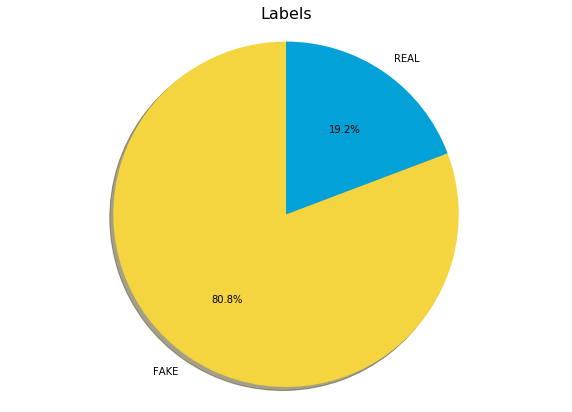

In [17]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'FAKE', 'REAL'
sizes = [meta[meta.label == 'FAKE'].label.count(), meta[meta.label == 'REAL'].label.count()]

fig1, ax1 = plt.subplots(figsize=(10,7))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90, colors=['#f4d53f', '#02a1d8'])
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Labels', fontsize=16)

plt.show()

# Preview Videos and Zoom into Faces

In [0]:
def get_frame(filename):
    '''
    Helper function to return the 1st frame of the video by filename
    INPUT: 
        filename - the filename of the video
    OUTPUT:
        image - 1st frame of the video (RGB)
    '''
    # Playing video from file
    cap = cv2.VideoCapture(filename)
    ret, frame = cap.read()

    # Our operations on the frame come here
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # When everything done, release the capture
    cap.release()
    cv2.destroyAllWindows()
    
    return image

def get_label(filename, meta):
    '''
    Helper function to get a label from the filepath.
    INPUT:
        filename - filename of the video
        meta - dataframe containing metadata.json
    OUTPUT:
        label - label of the video 'FAKE' or 'REAL'
    '''
    video_id = filename.split('/')[-1]
    return meta.loc[video_id].label

def get_original_filename(filename, meta):
    '''
    Helper function to get the filename of the original image
    INPUT:
        filename - filename of the video
        meta - dataframe containing metadata.json
    OUTPUT:
        original_filename - name of the original video
    '''
    video_id = filename.split('/')[-1]
    original_id = meta.loc[video_id].original
    
    return original_id

def visualize_frame(filename, meta, train = True):
    '''
    Helper function to visualize the 1st frame of the video by filename and metadata
    INPUT:
        filename - video filename
        meta - dataframe containing metadata.json
        train - indicates that the video is among train samples and the label can be retrived from metadata
    '''
    # get the 1st frame of the video
    image = get_frame(filename)

    # Display the 1st frame of the video
    fig, axs = plt.subplots(1,3, figsize=(20,7))
    axs[0].imshow(image) 
    axs[0].axis('off')
    axs[0].set_title('Original frame')
    
    # Extract the face with haar cascades
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

    # run the detector
    # the output here is an array of detections; the corners of each detection box
    # if necessary, modify these parameters until you successfully identify every face in a given image
    faces = face_cascade.detectMultiScale(image, 1.2, 3)

    # make a copy of the original image to plot detections on
    image_with_detections = image.copy()

    # loop over the detected faces, mark the image where each face is found
    for (x,y,w,h) in faces:
        # draw a rectangle around each detected face
        # you may also need to change the width of the rectangle drawn depending on image resolution
        cv2.rectangle(image_with_detections,(x,y),(x+w,y+h),(255,0,0),3)

    axs[1].imshow(image_with_detections)
    axs[1].axis('off')
    axs[1].set_title('Highlight faces')
    
    # crop out the 1st face
    crop_img = image.copy()
    for (x,y,w,h) in faces:
        crop_img = image[y:y+h, x:x+w]
        break;
        
    # plot the 1st face
    axs[2].imshow(crop_img)
    axs[2].axis('off')
    axs[2].set_title('Zoom-in face')
    
    if train:
        plt.suptitle('Image {image} label: {label}'.format(image = filename.split('/')[-1], label=get_label(filename, meta)))
    else:
        plt.suptitle('Image {image}'.format(image = filename.split('/')[-1]))
    plt.show()

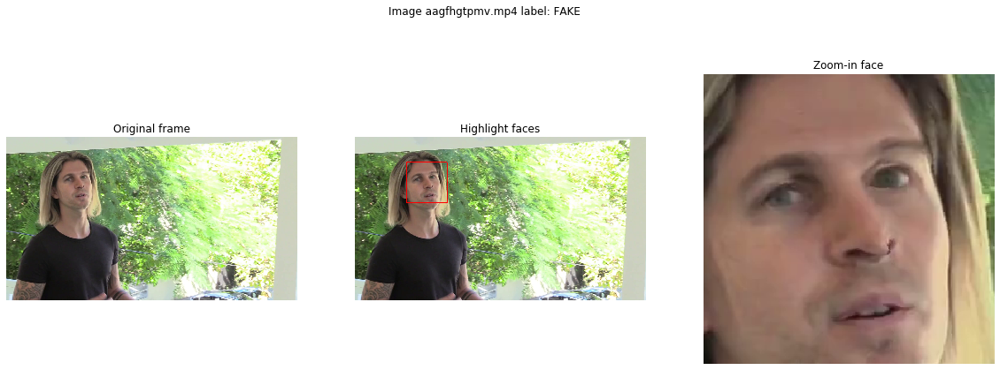

In [35]:
visualize_frame(train_fns[0], meta)

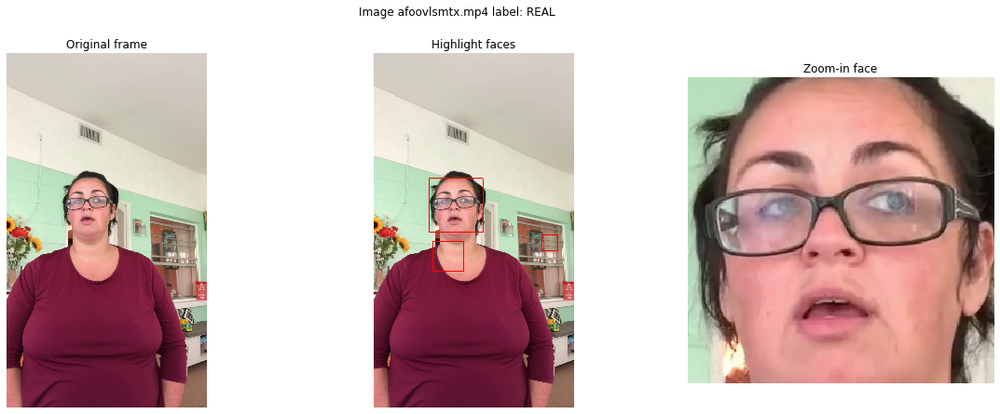

In [34]:
visualize_frame('data/train_sample_videos/afoovlsmtx.mp4', meta)

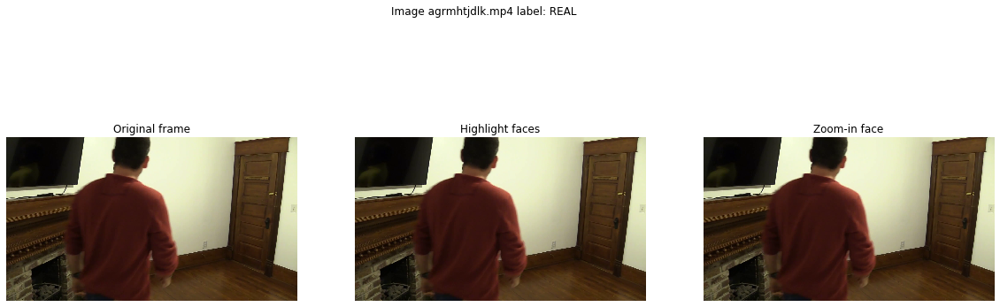

In [37]:
visualize_frame('data/train_sample_videos/agrmhtjdlk.mp4', meta)

# Preview Multiple Frames

In [0]:
def get_frames(filename):
    '''
    Get all frames from the video
    INPUT:
        filename - video filename
    OUTPUT:
        frames - the array of video frames
    '''
    frames = []
    cap = cv2.VideoCapture(filename)

    while(cap.isOpened()):
        ret, frame = cap.read()
                
        if not ret:
            break;
            
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(image)

    cap.release()
    cv2.destroyAllWindows()
    return frames

def create_animation(filename):
    '''
    Function to plot the animation with matplotlib
    INPUT:
        filename - filename of the video
    '''
    fig = plt.figure(figsize=(10,7))
    frames = get_frames(filename)

    ims = []
    for frame in frames:
        im = plt.imshow(frame, animated=True)
        ims.append([im])

    animation = ArtistAnimation(fig, ims, interval=30, repeat_delay=1000)
    plt.show()
    return animation

def visualize_several_frames(frames, step=100, cols = 3, title=''):
    '''
    Function to visualize the frames from the video
    INPUT:
        filename - filename of the video
        step - the step between the video frames to visualize
        cols - number of columns of frame grid
    '''
    n_frames = len(range(0, len(frames), step))
    rows = n_frames // cols
    if n_frames % cols > 0:
        rows = rows + 1
    
    fig, axs = plt.subplots(rows, cols, figsize=(20,20))
    for i in range(0, n_frames):
        frame = frames[i]
        
        r = i // cols
        c = i % cols
        
        axs[r,c].imshow(frame)
        axs[r,c].axis('off')
        axs[r,c].set_title(str(i))
        
    plt.suptitle(title)
    plt.show()

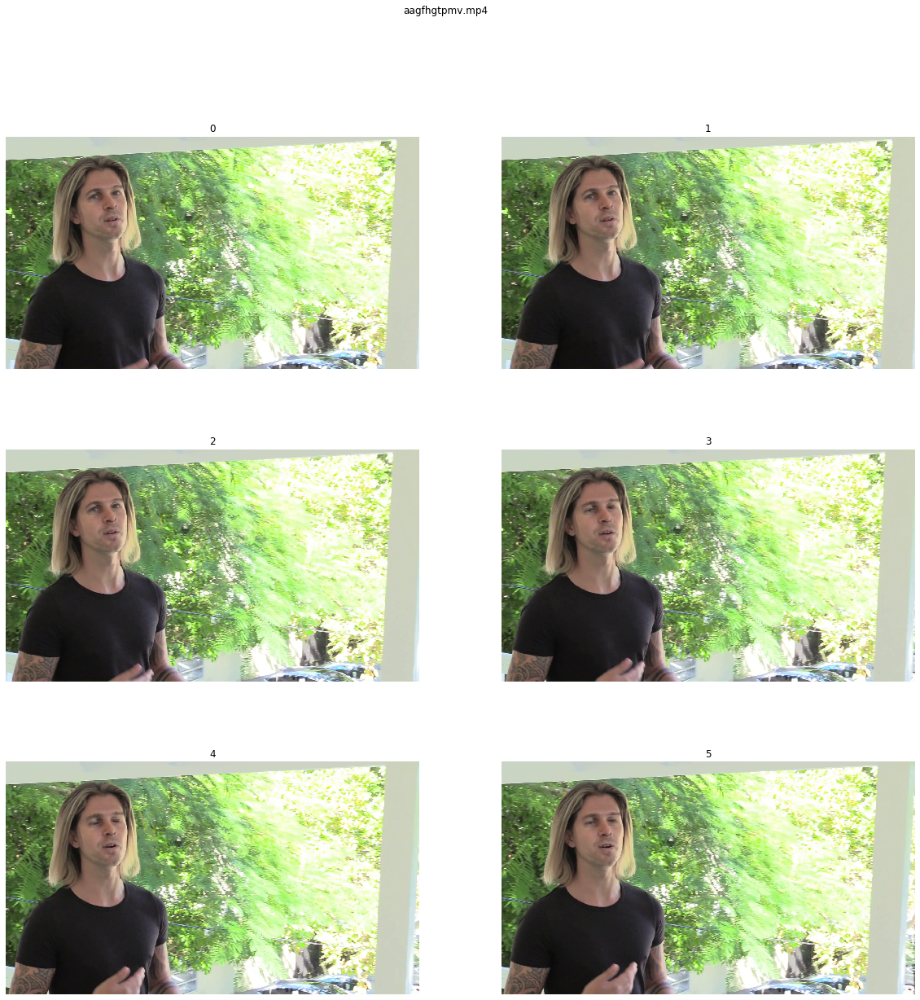

In [39]:
frames = get_frames(train_fns[0])
visualize_several_frames(frames, step=50, cols = 2, title=train_fns[0].split('/')[-1])

# Create animation

In [0]:


def get_frames_zoomed(filename):
    '''
    Get all frames from the video zoomed into the face
    INPUT:
        filename - video filename
    OUTPUT:
        frames - the array of video frames
    '''
    frames = []
    cap = cv2.VideoCapture(filename)
    
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

    while(cap.isOpened()):
        ret, frame = cap.read()
                
        if not ret:
            break;
            
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        faces = face_cascade.detectMultiScale(image, 1.2, 3)
        image_with_detections = image.copy()

        crop_img = image.copy()
        for (x,y,w,h) in faces:
            crop_img = image[y:y+h, x:x+w]
            break;
        
        frames.append(crop_img)

    cap.release()
    cv2.destroyAllWindows()
    return frames

def create_animation_zoomed(filename):
    '''
    Function to create the animated cropped faces out of the video
    INPUT:
        filename - filename of the video
    '''
    fig, ax = plt.subplots(1,1, figsize=(10,7))
    frames = get_frames_zoomed(filename)

    def update(frame_number):
        plt.axis('off')
        plt.imshow(frames[frame_number])

    animation = FuncAnimation(fig, update, interval=30, repeat=True)
    return animation



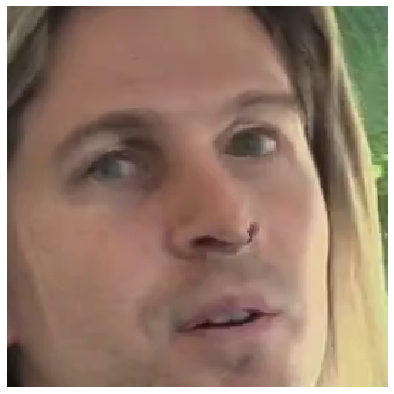

In [41]:
animation = create_animation_zoomed(train_fns[0])
HTML(animation.to_jshtml())

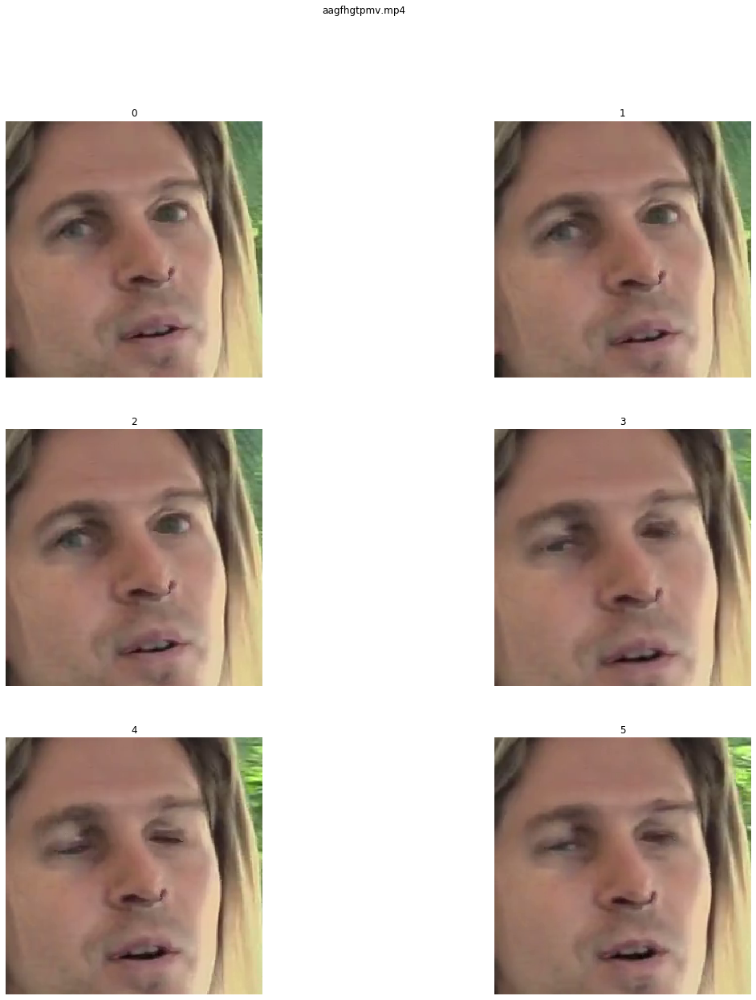

In [42]:
# visualize the zoomed in frames
frames_face = get_frames_zoomed(train_fns[0])
visualize_several_frames(frames_face, step=55, cols = 2, title=train_fns[0].split('/')[-1])

In [0]:
# Explore the Similarity between Frames
def get_similarity_scores(frames):
    '''
    Get the list of similarity scores between the frames.
    '''
    scores = []
    for i in range(1, len(frames)):
        frame = frames[i]
        prev_frame = frames[i-1]
        
        if frame.shape[0] != prev_frame.shape[0]:
            if  frame.shape[0] > prev_frame.shape[0]:
                frame = frame[:prev_frame.shape[0], :prev_frame.shape[0], :]
            else:
                prev_frame = prev_frame[:frame.shape[0], :frame.shape[0], :]
        
        (score, diff) = compare_ssim(frame, prev_frame, full=True, multichannel=True)
        scores.append(score)
    return scores

def plot_scores(scores):
    '''
    Plot the similarity scores
    '''
    plt.figure(figsize=(12,7))
    plt.plot(scores)
    plt.title('Similarity Scores')
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  app.launch_new_instance()


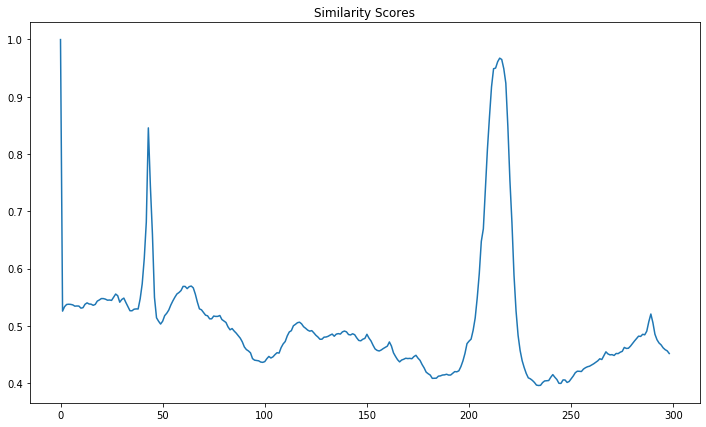

In [44]:
scores = get_similarity_scores(frames)
plot_scores(scores)